# Gender Classification

This notebook builds an end-to-end gender classification project using TensorFlow 2.x and TensorFlow Hub.

## Problem

Identifying gender from images of individuals who are male and female.

In [ ]:
# Unzip the uploaded data into Google Drive
!unzip "/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/archive.zip" -d "/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/0 (1367).jpg  
  inflating: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/0 (1368).jpg  
  inflating: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/0 (1369).jpg  
  inflating: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/0 (137).jpg  
  inflating: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/0 (1370).jpg  
  inflating: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/0 (1371).jpg  
  inflating: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Femal

In [4]:
# Import necessary tools
# Tensorflow hub is used to pick a model
import tensorflow as tf
import tensorflow_hub as hub
print('TF version', tf.__version__)
print('TF Hub version', hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version 2.15.0
TF Hub version 0.16.1
GPU available (YESSSS!!!!!)


# Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

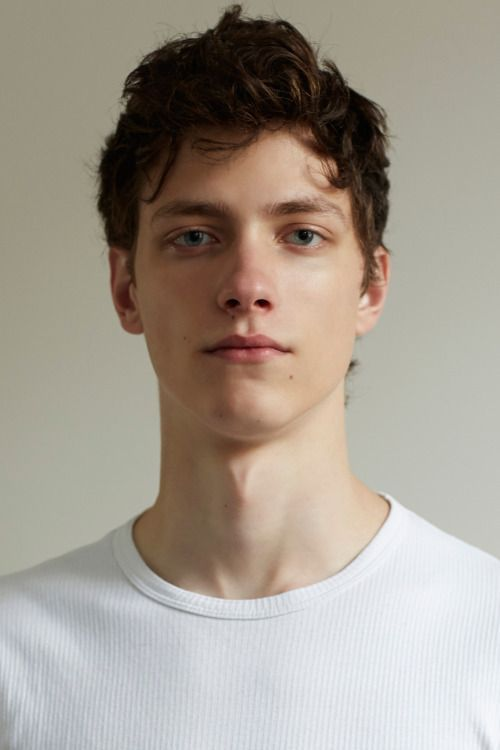

In [3]:
 # Let's view an image
 from IPython.display import Image
 Image('/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/1 (2560).jpg')

In [6]:
#Checking number of male images and creating labels

import os

print(len(os.listdir("/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/")))

male_label = []

for i in range(2720):
  male_label.append('male')

len(male_label)

2720


2720

In [7]:
#Checking number of female image and creating label

import os

print(len(os.listdir("/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/")))

female_label = []

for i in range(len(os.listdir("/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/"))):
  female_label.append('female')

len(female_label)

2698


2698

In [8]:
# Create pathnames from image ID's
male_filenames = ["/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/" + fname  for fname in os.listdir("/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/")]

# Check the first 10
male_filenames[:10]

len(male_filenames)

2720

In [9]:
# Create pathnames from image ID's
female_filenames = ["/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/" + fname  for fname in os.listdir("/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Female Faces/")]

# Check the first 10
female_filenames[:10]

len(female_filenames)

2698

In [10]:
# Adding both filenames and labels

total_filenames = male_filenames + female_filenames
total_labels = male_label + female_label

len(total_filenames), len(total_labels)

(5418, 5418)

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [11]:
import numpy as np
labels = np.array(total_labels) # Changes into numpy array
labels

array(['male', 'male', 'male', ..., 'female', 'female', 'female'],
      dtype='<U6')

In [12]:
len(labels)

5418

In [13]:
# See if number of labels matches the number of filenames
if len(labels) == len(total_filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [14]:
# Find the unique label values
unique_gender = np.unique(labels)
print(unique_gender)
len(unique_gender)

['female' 'male']


2

In [15]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_gender

male


array([False,  True])

In [16]:
len(labels)

5418

In [17]:
# Turn every label into a boolean array
boolean_labels = [label == unique_gender for label in labels]
boolean_labels[:2]

[array([False,  True]), array([False,  True])]

In [18]:
len(boolean_labels)

5418

In [19]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_gender == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

male
(array([1]),)
1
[0 1]


### Creating our own Validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [20]:
# Setup X and y variables
X = total_filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [21]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000,max:10000}

In [22]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
# split them into two training and validation of total size NUM_IMAGES
xtrain,xval,ytrain,yval = train_test_split(X[:NUM_IMAGES],
                                            y[:NUM_IMAGES],
                                            test_size = 0.2,
                                            random_state=42)
len(xtrain), len(ytrain), len(xval), len(yval)

(800, 800, 200, 200)

In [23]:
# Let's have a geex at training data
xtrain[:5], ytrain[:2]

(['/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/1 (2580).jpg',
  '/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/1 (53).png',
  '/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/1 (688).jpg',
  '/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/1 (631).jpg',
  '/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female face dataset/Male Faces/1 (867).jpg'],
 [array([False,  True]), array([False,  True])])

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

Before we do, let's see what importing an image looks like.

In [24]:
# Convert an image to numpy
from matplotlib.pyplot import imread
image = imread(total_filenames[42])
image.shape

(640, 640, 3)

array([[[10, 10, 10],
        [ 5,  5,  5],
        [18, 18, 18],
        ...,
        [48, 48, 48],
        [48, 48, 48],
        [47, 47, 47]],

       [[ 6,  6,  6],
        [14, 14, 14],
        [27, 27, 27],
        ...,
        [49, 49, 49],
        [49, 49, 49],
        [47, 47, 47]],

       [[16, 16, 16],
        [ 6,  6,  6],
        [13, 13, 13],
        ...,
        [48, 48, 48],
        [48, 48, 48],
        [46, 46, 46]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)
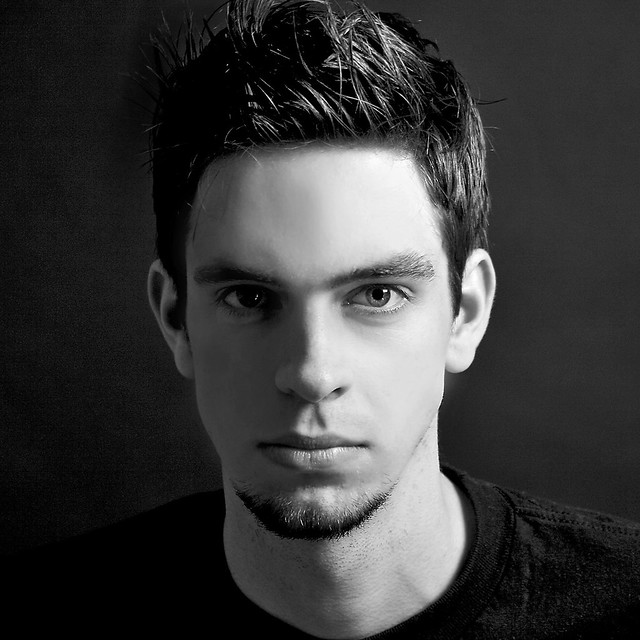

In [25]:
image

In [26]:
# turn image into a tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 640, 3), dtype=uint8, numpy=
array([[[10, 10, 10],
        [ 5,  5,  5],
        [18, 18, 18],
        ...,
        [48, 48, 48],
        [48, 48, 48],
        [47, 47, 47]],

       [[ 6,  6,  6],
        [14, 14, 14],
        [27, 27, 27],
        ...,
        [49, 49, 49],
        [49, 49, 49],
        [47, 47, 47]]], dtype=uint8)>

In [27]:
#both tensor and array are same but gpu use tensors to compute fast
image[:2]

array([[[10, 10, 10],
        [ 5,  5,  5],
        [18, 18, 18],
        ...,
        [48, 48, 48],
        [48, 48, 48],
        [47, 47, 47]],

       [[ 6,  6,  6],
        [14, 14, 14],
        [27, 27, 27],
        ...,
        [49, 49, 49],
        [49, 49, 49],
        [47, 47, 47]]], dtype=uint8)

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [28]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values to make it efficient
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).

In [29]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [30]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.0467387 , 0.0467387 , 0.0467387 ],
         [0.02456983, 0.02456983, 0.02456983],
         [0.05180071, 0.05180071, 0.05180071],
         ...,
         [0.18133268, 0.18133268, 0.18133268],
         [0.18017207, 0.18017207, 0.18017207],
         [0.18767475, 0.18767475, 0.18767475]],
 
        [[0.04993998, 0.04993998, 0.04993998],
         [0.04083634, 0.04083634, 0.04083634],
         [0.04349739, 0.04349739, 0.04349739],
         ...,
         [0.1818125 , 0.1818125 , 0.1818125 ],
         [0.17272913, 0.17272913, 0.17272913],
         [0.17719081, 0.17719081, 0.17719081]],
 
        [[0.03583432, 0.03583432, 0.03583432],
         [0.05366147, 0.05366147, 0.05366147],
         [0.03519405, 0.03519405, 0.03519405],
         ...,
         [0.17625059, 0.17625059, 0.17625059],
         [0.18685469, 0.18685469, 0.18685469],
         [0.18141319, 0.18141319, 0.18141319]],
 
        ...,
 
        [[0.        , 0.        

Now we've got a way to turn our data into tuples of Tensors in the form: (image, label), let's make a function to turn all of our data (X & y) into batches!

In [31]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [32]:
# Create training and validation data batches
train_data = create_data_batches(xtrain, ytrain)
val_data = create_data_batches(xval, yval, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [33]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [34]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1) # i+1 is indexing for subplot
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_gender[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [35]:
# we need to remove the batch so that the above function can be used
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

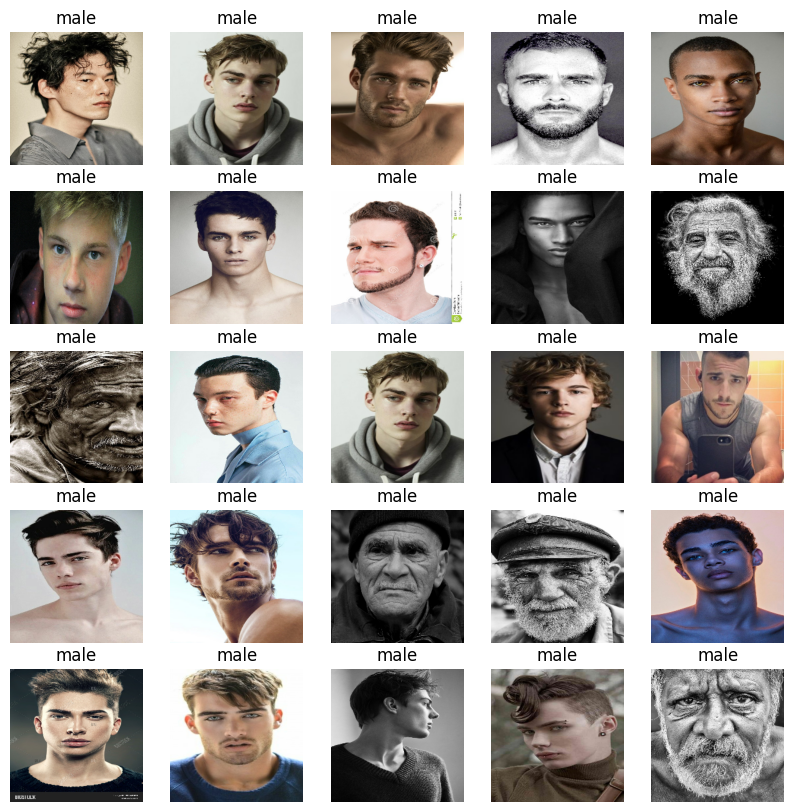

In [36]:
# Now let's visualize the data in a training batch
# train_data.as_numpy_iterator() - this converts batches into numpy arrays
# next is like a loop which gets the data from iterator and assigns the value to train_images, train_labels one by one
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

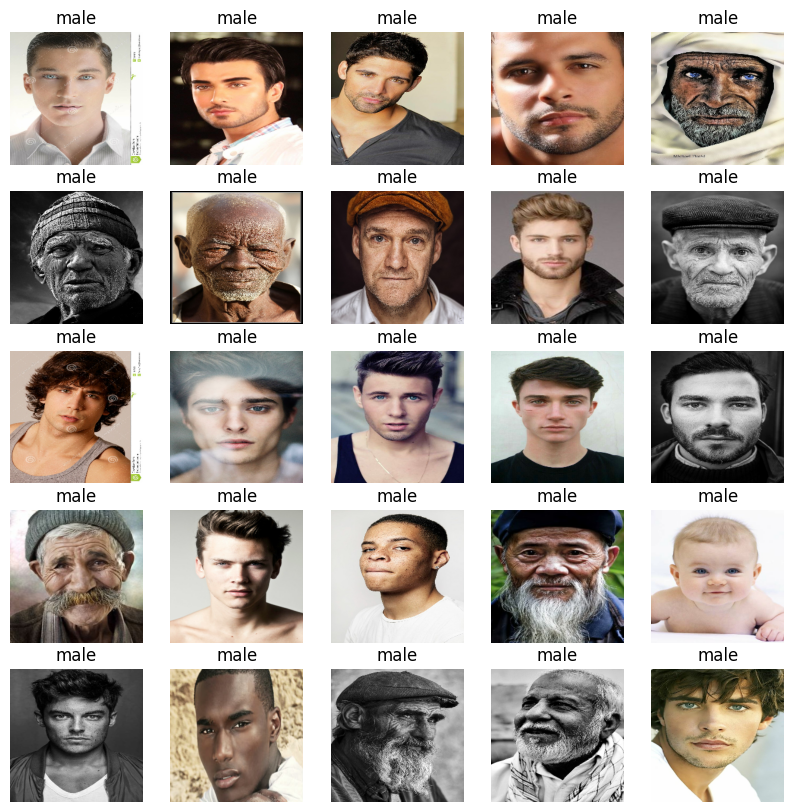

In [ ]:
# Now let's visualize the data in a validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building our model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [37]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_gender)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [38]:
# Create a function which builds a Keras model
# keras is an API used to fetch the model and use it
# tf.keras.Sequential - this will allow the code below to be run in sequential order
# units=OUTPUT_SHAPE - this tell the model that we want the output shape to be in the size of 2 values
# sigmoid will make the output in the interval between (0,1) , the highest number between the interval is the correct output

# loss=tf.keras.losses.BinaryCrossentropy(), - Higher the loss value , the worst our model is predicting - lower the loss , the best our model is predicting
# optimizer=tf.keras.optimizers.Adam(), - adam optimizer will instruct the loss function to improve the guesses
# metrics=["accuracy"] - this will tell the accuracy of  how well our model is predicting the image

# model.build(INPUT_SHAPE) - this will use all the above code in keras sequential to build the model for predicting

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="sigmoid") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.BinaryCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [39]:
model = create_model()
model.summary()



Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 2)                 2004      
                                                                 
Total params: 5434717 (20.73 MB)
Trainable params: 2004 (7.83 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [40]:
# Load TensorBoard notebook extension
# this will allow tensorboard to display in our notebook
%load_ext tensorboard

In [41]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [42]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [43]:
# EPHOCS - this will tell the progress of the model(accuracy) till 100 when training
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10 }

In [44]:
# Check to make sure we're still running on a GPU
print('GPU', 'available (YESSS!)' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available (YESSS!)


Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [45]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.

  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train our model
  # the performance of our model will be tracked in the logs folder
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  # validation_freq=1 - Once in a epoch the validation set will be checked once for accuracy
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [46]:
# Fit the model the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 29s 811ms/step - loss: 0.1030 - accuracy: 0.9712 - val_loss: 0.0041 - val_accuracy: 1.0000
Epoch 2/100
25/25 [==============================] - 21s 812ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 3/100
25/25 [==============================] - 20s 832ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 4/100
25/25 [==============================] - 26s 1s/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0018 - val_accuracy: 1.0000


**Question**: It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note**: Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the tensorboard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [47]:
# use \ wherever there is space in our folder name
%tensorboard --logdir /content/drive/MyDrive/Complete-AI\ ML\ Bootcamp/Gender_classification/Male\ and\ Female\ dataset/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [48]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 7s 919ms/step


array([[1.93136555e-04, 9.99863744e-01],
       [5.69301483e-04, 9.99911904e-01],
       [7.33307461e-05, 9.99968052e-01],
       [9.56371991e-07, 9.99992609e-01],
       [6.73658133e-06, 9.99982595e-01],
       [1.24510216e-05, 9.99971867e-01],
       [6.59943362e-06, 9.99994397e-01],
       [1.39240319e-06, 9.99996662e-01],
       [6.36602752e-04, 9.98616576e-01],
       [2.68162024e-04, 9.99846339e-01],
       [3.95626084e-05, 9.99974132e-01],
       [1.00530742e-04, 9.99926090e-01],
       [3.29332979e-05, 9.99969363e-01],
       [6.80078892e-06, 9.99866247e-01],
       [4.93434818e-05, 9.99953747e-01],
       [1.70784173e-04, 9.97587562e-01],
       [7.84989970e-06, 9.99996662e-01],
       [2.40864847e-06, 9.99968171e-01],
       [1.14642817e-03, 9.95644689e-01],
       [2.54709423e-01, 9.44689453e-01],
       [9.92009700e-06, 9.99966621e-01],
       [8.36668005e-06, 9.99070704e-01],
       [1.19377080e-04, 9.99633789e-01],
       [3.48025264e-06, 9.99981165e-01],
       [7.014434

In [49]:
predictions.shape

(200, 2)

In [50]:
# The highest number in this array is the predicted output(label)
predictions[0]

array([1.9313656e-04, 9.9986374e-01], dtype=float32)

In [51]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_gender[np.argmax(predictions[index])]}")

[9.236832e-06 9.999926e-01]
Max value (probability of prediction): 0.9999926090240479
Sum: 1.0000017881393433
Max index: 1
Predicted label: male


Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note**: Prediction probabilities are also known as confidence levels.

In [52]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_gender[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'male'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [53]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

In [54]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_gender[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.8313726 , 0.8313726 , 0.79215693],
         [0.8313726 , 0.8313726 , 0.79215693],
         [0.8352942 , 0.8431373 , 0.8000001 ],
         ...,
         [0.9960785 , 0.9960785 , 0.9960785 ],
         [0.9960785 , 0.9960785 , 0.9960785 ],
         [0.9960785 , 0.9960785 , 0.9960785 ]],
 
        [[0.8313726 , 0.8313726 , 0.79215693],
         [0.8313726 , 0.8313726 , 0.79215693],
         [0.83921576, 0.83921576, 0.8000001 ],
         ...,
         [0.9960785 , 0.9960785 , 0.9960785 ],
         [0.9960785 , 0.9960785 , 0.9960785 ],
         [0.9960785 , 0.9960785 , 0.9960785 ]],
 
        [[0.8313726 , 0.8313726 , 0.79215693],
         [0.8313726 , 0.8313726 , 0.79215693],
         [0.83921576, 0.83921576, 0.8000001 ],
         ...,
         [0.9960785 , 0.9960785 , 0.9960785 ],
         [0.9960785 , 0.9960785 , 0.9960785 ],
         [0.9960785 , 0.9960785 , 0.9960785 ]],
 
        ...,
 
        [[0.6748687 , 0.66702557, 0.67094713],
         [0.6392157 , 0.6313726 , 0.63529

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [55]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

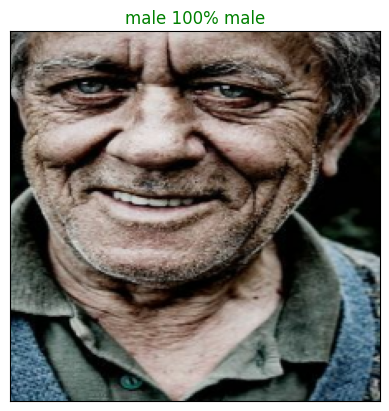

In [56]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=70)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅

* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [57]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_gender[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

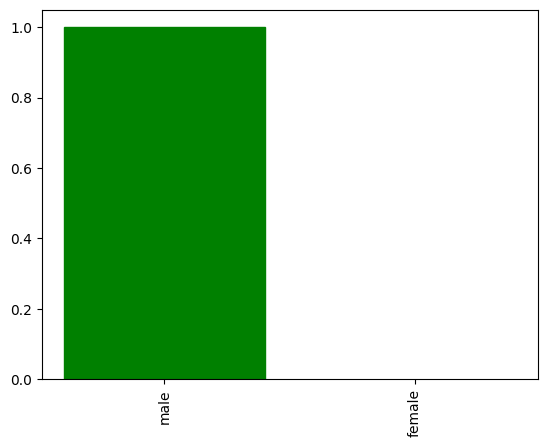

In [58]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=199)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

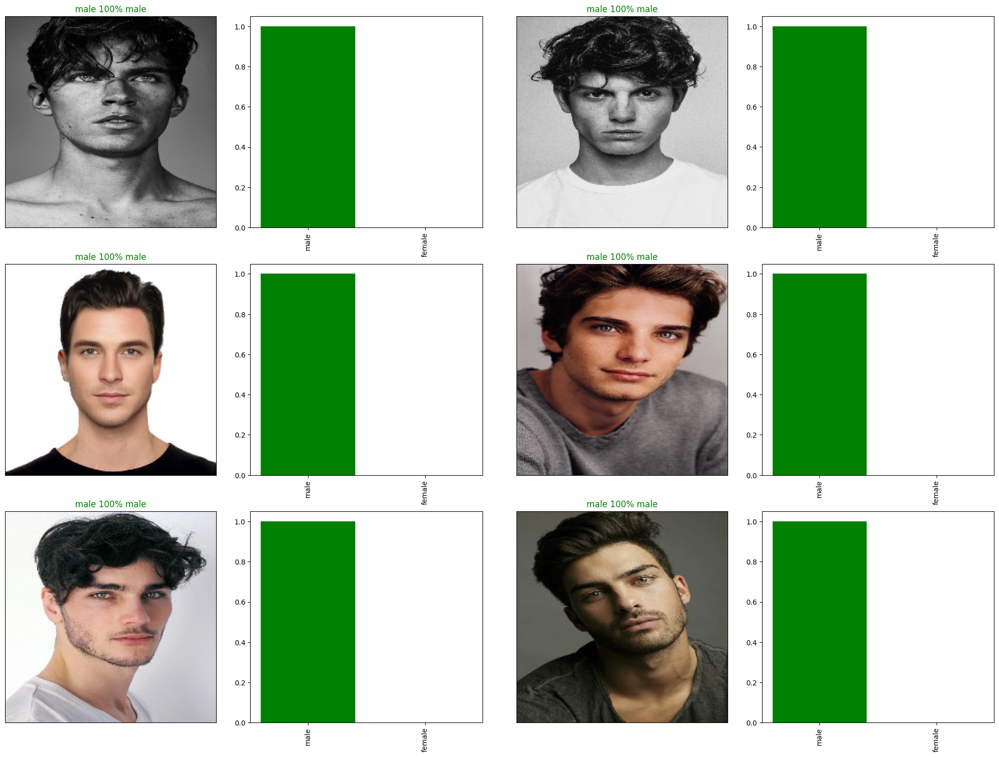

In [62]:
# Let's check out a few predictions and their different values
i_multiplier = 60
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

#plt.tight_layout(h_pad=1.0)# - this will bring all the subplots together
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [63]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [64]:
# Create a function to load a trained model
# custom_objects={"KerasLayer":hub.KerasLayer}) - this is because we are using special model using url from tensorflowhub
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [65]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models/20240607-07421717746135-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models/20240607-07421717746135-1000-images-mobilenetv2-Adam.h5'

In [69]:
# Load in the full model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models/20240607-07421717746135-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models/20240607-07421717746135-1000-images-mobilenetv2-Adam.h5


In [70]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 4s 614ms/step - loss: 0.0018 - accuracy: 1.0000


[0.0018213056027889252, 1.0]

In [71]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 7s 1s/step - loss: 0.0018 - accuracy: 1.0000


[0.0018213056027889252, 1.0]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(5418, 5418)

In [ ]:
# Create a data batch with full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note**: Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
#full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
170/170 [==============================] - 590s 3s/step - loss: 0.2538 - accuracy: 0.9073
Epoch 2/100
170/170 [==============================] - 485s 3s/step - loss: 0.1509 - accuracy: 0.9504
Epoch 3/100
170/170 [==============================] - 488s 3s/step - loss: 0.1216 - accuracy: 0.9577
Epoch 4/100
170/170 [==============================] - 479s 3s/step - loss: 0.1065 - accuracy: 0.9633
Epoch 5/100
170/170 [==============================] - 486s 3s/step - loss: 0.0920 - accuracy: 0.9686
Epoch 6/100
170/170 [==============================] - 488s 3s/step - loss: 0.0831 - accuracy: 0.9721
Epoch 7/100
170/170 [==============================] - 491s 3s/step - loss: 0.0770 - accuracy: 0.9745
Epoch 8/100
170/170 [==============================] - 483s 3s/step - loss: 0.0700 - accuracy: 0.9788
Epoch 9/100
170/170 [==============================] - 482s 3s/step - loss: 0.0642 - accuracy: 0.9806
Epoch 10/100
170/170 [==============================] - 482s 3s/step - loss: 0.059

In [ ]:
#save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models/20240605-22071717625253-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models/20240605-22071717625253-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models/20240605-22071717625253-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Male and Female dataset/models/20240605-22071717625253-full-image-set-mobilenetv2-Adam.h5


# Making predictions on custom images

To make predictions on custom images, we'll:

1. Get the filepaths of our own images.
2. Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
3. Pass the custom image data batch to our model's predict() method.
4. Convert the prediction output probabilities to predictions labels.
5. Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
import os
custom_path = "/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Testing images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Testing images/sample img2.jpeg',
 '/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Testing images/sample img3.jpeg',
 '/content/drive/MyDrive/Complete-AI ML Bootcamp/Gender_classification/Testing images/IMG_8075.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 191ms/step


In [ ]:
custom_preds.shape

(3, 2)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['female', 'male', 'male']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

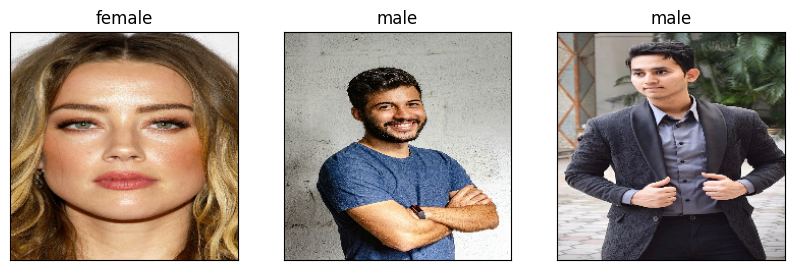

In [ ]:
# Check custom image predictions
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
